# Plots / code for the documentation

In [1]:
import matplotlib.pyplot as plt
from matplotlib.axes._axes import Axes
from matplotlib.colors import Colormap, Normalize, LinearSegmentedColormap
from matplotlib.cm import grey, inferno, viridis_r
import sys
from pathlib import Path
from PIL import Image

In [2]:
# If neurotorch is needed
sys.path.insert(1, nt_path := str((Path("").resolve().parent.parent).resolve()))
import neurotorchmz
from neurotorchmz.core.session import *
print("NeurotorchMZ version", neurotorchmz.__version__)
%matplotlib inline

NeurotorchMZ version 25.3.1_dev


In [ ]:
session = neurotorchmz.Start_Background(edition=neurotorchmz.Edition.NEUROTORCH_DEBUG)
%matplotlib inline

[2025-03-22 15:50:19,316 DEBUG]: Enabled debugging output to console


[2025-03-22 15:50:25,616 DEBUG]: Opening +40118_CS1-2_37a+47_iGlu.tif with tifffile
[2025-03-22 15:50:44,628 DEBUG]: Opening control_R2-3.nd2 with nd2
DEBUG:NeurotorchMZ:Opening control_R2-3.nd2 with nd2


In [4]:
def set_active_imgObj():
    global imgObj
    imgObj = session.active_image_object
    print("ImageObject loaded")
session.api.open_file(Path(r"D:\Eigene Datein\dev\AG Heine Hiwi\Testdaten\Neuroimages\Gruppe 1 R1 control_Glu_1-2.nd2")).add_callback(set_active_imgObj)

<Task open image file: reading File (step 1/6) for 0.00s>

[2025-03-22 15:36:11,935 DEBUG]: Opening Gruppe 1 R1 control_Glu_1-2.nd2 with nd2


ImageObject loaded


In [5]:
imgObj = session.active_image_object

In [6]:
def image_to_rgb(img: np.ndarray, cmap: Colormap, norm:tuple[float, float] = (0,1)):
    """ Convert a given 2D image in greyscale to an rgb variant using the given colormap of matplotlib """
    if len(img.shape) != 2:
        raise ValueError(f"Shape of image must have length 2")
    if norm[0] < 0 or norm[0] >= 1 or norm[1] <= 0 or norm[1] > 1 or norm[1] <= norm[0]:
        raise ValueError(f"The norm must be a tuple (a, b) where a and b in [0,1] and a < b")
    _min, _max = np.min(img), np.max(img)
    _min, _max = _min + norm[0]*(_max - _min), _min + norm[1]*(_max - _min)
    _img_norm = (img-_min)/(_max-_min)
    return cmap(_img_norm)[:, :, 0:3]

def save_img(img_rgb: np.ndarray, path: Path):
    if len(img_rgb.shape) != 3 or img_rgb.shape[2] != 3:
        raise ValueError(f"The image must be a 2D rgb or rgba image")
    im = Image.fromarray((img_rgb*255).astype(np.uint8))
    im.save(path)

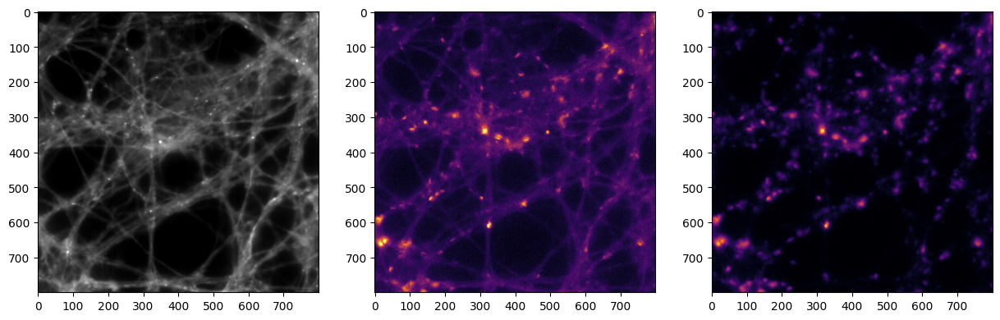

In [51]:
imgMean = imgObj.imgView(ImageView.SPATIAL).Mean
imgDiffMax = imgObj.imgDiff_NormalView(ImageView.SPATIAL).Max
imgDiffConvMax = imgObj.imgDiff_ConvView(ImageView.SPATIAL).Max

imgMean_rgb = image_to_rgb(imgMean, grey, norm=(0.05,0.5))
imgDiffMax_rgb = image_to_rgb(imgDiffMax, inferno, norm=(0.05, 0.6))
imgDiffConvMax_rgb = image_to_rgb(imgDiffConvMax, inferno)

fig, axes = plt.subplots(1, 3, figsize=(15,5))
axes[0].imshow(imgMean_rgb)
axes[1].imshow(imgDiffMax_rgb)
axes[2].imshow(imgDiffConvMax_rgb)
plt.show()

In [52]:
export_img_path = Path(r"D:\Eigene Datein\dev\AG Heine Hiwi\Projekte\Neurotorch\Gruppe 1 R1 ctrl 2 images und plots").resolve()
save_img(imgMean_rgb, export_img_path/"example_img02_img_mean.png")
save_img(imgDiffMax_rgb, export_img_path/"example_img02_imgDiff_max.png")

#### Plotting frame 99 (starting at 0) to 104

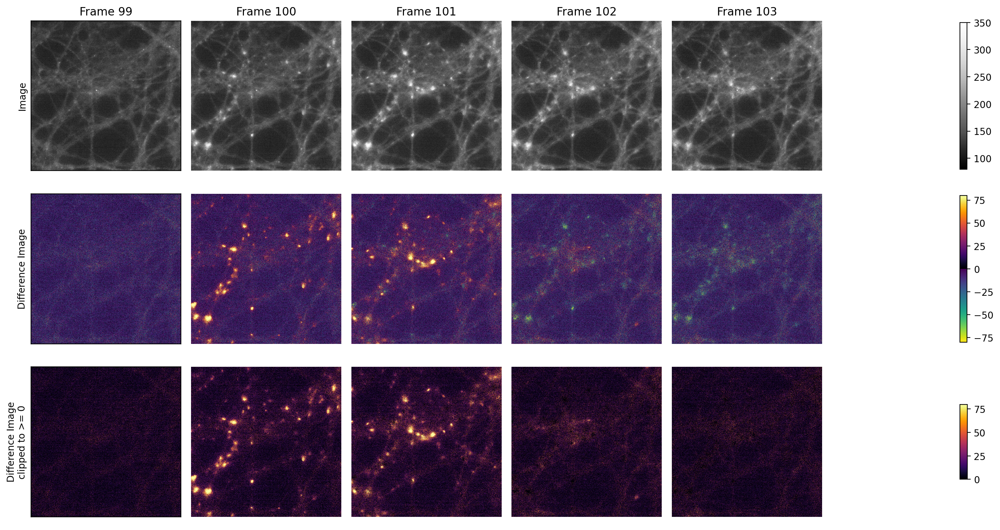

In [32]:
def plot_frame_diff_overview(convMode = False):
    plt_range = list(range(99, 104))
    fig, axes = plt.subplots(3, len(plt_range)+1, figsize=(15,8), dpi=200)
    for ax in axes.flatten():
        ax.set_axis_off()

    for i in range(axes.shape[0]):
        ax: Axes = axes[i,0]
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_axis_on()
        ax.set_yticklabels([])
        ax.set_xticklabels([])
    
    if convMode:
        axes[0,0].set_ylabel("Difference Image")
        axes[1,0].set_ylabel("Difference Image convoluted\n(Gaussian, σ=2px)")
        axes[2,0].set_ylabel("Difference Image convoluted\n(Gaussian, σ=5px)")
    else:
        axes[0,0].set_ylabel("Image")
        axes[1,0].set_ylabel("Difference Image")
        axes[2,0].set_ylabel("Difference Image\nclipped to >= 0")

    imgNorm = Normalize(vmin=80, vmax=350)

    colors1 = viridis_r(np.linspace(0., 1, 128))
    colors2 = inferno(np.linspace(0, 1, 128))
    colors = np.vstack((colors1, colors2))
    cmap_diff = LinearSegmentedColormap.from_list('cmap_diff', colors)
    imgDiff_norm = Normalize(vmin=-80, vmax=80)
    imgDiffClipped_norm = Normalize(vmin=0, vmax=80)


    for i in range(len(plt_range)):
        ax0: Axes = axes[0,i]
        ax1: Axes = axes[1,i]
        ax2: Axes = axes[2,i]
        frame = plt_range[i]
        ax0.set_title(f"Frame {frame}")
        img_frame = imgObj.img[frame]
        imgDiffNormal_frame: np.ndarray = imgObj.imgDiff_Normal[frame - 1]

        if convMode:
            imgObj.SetConvolutionFunction(ImageObject.Conv_GaussianBlur, func_args={"sigma": 2})
            imgDiffConv2_frame: np.ndarray = imgObj.imgDiff_Conv[frame - 1]
            imgObj.SetConvolutionFunction(ImageObject.Conv_GaussianBlur, func_args={"sigma": 5})
            imgDiffConv5_frame: np.ndarray = imgObj.imgDiff_Conv[frame - 1]
            
            ax0_imshow = ax0.imshow(imgDiffNormal_frame, cmap="inferno", norm=imgDiffClipped_norm)
            ax1_imshow = ax1.imshow(imgDiffConv2_frame, cmap="inferno", norm=imgDiffClipped_norm)
            ax2_imshow = ax2.imshow(imgDiffConv5_frame, cmap="inferno", norm=imgDiffClipped_norm)
        else:
            imgDiffNormal_clipped_frame = np.clip(imgDiffNormal_frame, a_min=0, a_max=None)
            ax0_imshow = ax0.imshow(img_frame, cmap="Greys_r", norm=imgNorm)
            ax1_imshow = ax1.imshow(imgDiffNormal_frame, cmap=cmap_diff, norm=imgDiff_norm)
            ax2_imshow = ax2.imshow(imgDiffNormal_clipped_frame, cmap="inferno", norm=imgDiffClipped_norm)

    fig.colorbar(ax0_imshow, ax=axes[0, axes.shape[1]-1], shrink=0.9)
    fig.colorbar(ax1_imshow, ax=axes[1, axes.shape[1]-1], shrink=0.9)
    fig.colorbar(ax2_imshow, ax=axes[2, axes.shape[1]-1], shrink=0.46, aspect=10, ticks=[0,25,50,75])
    fig.tight_layout()
    plt.show()

plot_frame_diff_overview(False)

### Plot convolutions

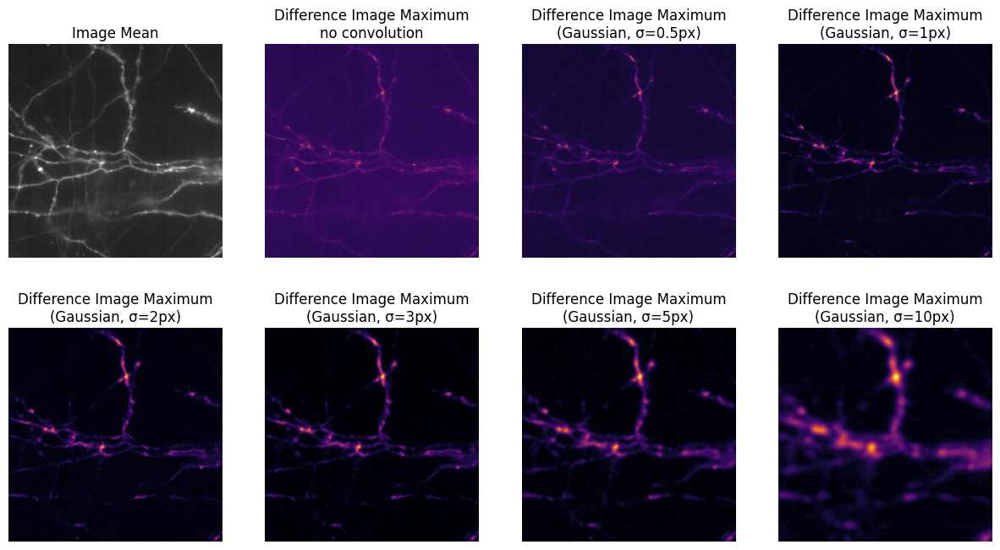

In [20]:
def plot_convolutions():
    frame = 100
    sigmas = [0.5, 1, 2, 3, 5, 10]
    fig, axes = plt.subplots(2, (2+len(sigmas))//2, figsize=(15,8), dpi=100)
    axes = axes.flatten()
    for ax in axes:
        ax.set_axis_off()

    axes[0].imshow(imgObj.imgView(ImageView.SPATIAL).Mean, cmap="Greys_r", norm=Normalize(vmin=100, vmax=170))
    axes[0].set_title("Image Mean")
    axes[1].imshow(imgObj.imgDiff_NormalView(ImageView.SPATIAL).Max, cmap="inferno")
    axes[1].set_title("Difference Image Maximum\nno convolution")

    for i in range(0, len(sigmas)):
        imgObj.SetConvolutionFunction(ImageObject.Conv_GaussianBlur, func_args={"sigma": sigmas[i]})
        axes[i+2].set_title(f"Difference Image Maximum\n(Gaussian, σ={sigmas[i]}px)")
        axes[i+2].imshow(imgObj.imgDiff_ConvView(ImageView.SPATIAL).Max, cmap="inferno")

    plt.show()

    fig.tight_layout()
plot_convolutions()